<h1>Оглавление<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Импорт-данных" data-toc-modified-id="Импорт-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Импорт данных</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка данных</a></span></li><li><span><a href="#Аугментация-изображений" data-toc-modified-id="Аугментация-изображений-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Аугментация изображений</a></span></li><li><span><a href="#CNN" data-toc-modified-id="CNN-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>CNN</a></span></li></ul></div>

Подключаем библиотеки

In [48]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random
import torch
import imgaug as ia

import warnings
warnings.filterwarnings("ignore")

Проверяем работает ли CUDA GPU для обучения CNN

In [49]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


## Импорт данных

Импортируем данные, и предобрабатываем их чтобы в столбцах с названием файлов изображений были не пути, а только сами файлы

In [50]:
datadir = 'self_driving_car/data'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(('D://Git/self_driving_car/data/driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_02_21_10_34_18_737.jpg,left_2023_02_21_10_34_18_737.jpg,right_2023_02_21_10_34_18_737.jpg,0.0,0.0,0.0,0.000078
1,center_2023_02_21_10_34_18_840.jpg,left_2023_02_21_10_34_18_840.jpg,right_2023_02_21_10_34_18_840.jpg,0.0,0.0,0.0,0.000079
2,center_2023_02_21_10_34_18_941.jpg,left_2023_02_21_10_34_18_941.jpg,right_2023_02_21_10_34_18_941.jpg,0.0,0.0,0.0,0.000078
3,center_2023_02_21_10_34_19_044.jpg,left_2023_02_21_10_34_19_044.jpg,right_2023_02_21_10_34_19_044.jpg,0.0,0.0,0.0,0.000078
4,center_2023_02_21_10_34_19_147.jpg,left_2023_02_21_10_34_19_147.jpg,right_2023_02_21_10_34_19_147.jpg,0.0,0.0,0.0,0.000078


Посмотрим на распределение собранных нами данных

total data: 7046


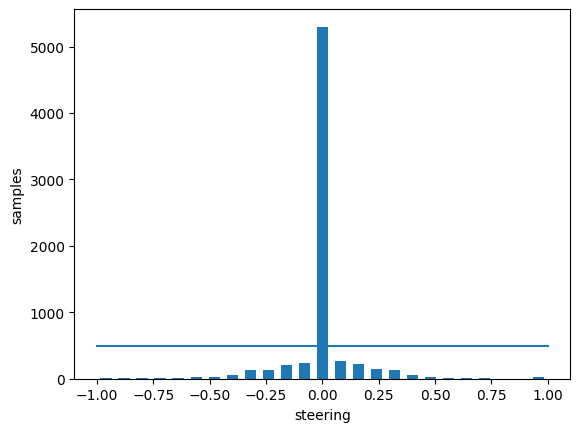

In [51]:
num_bins = 25
samples_per_bin = 500
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
plt.xlabel('steering')
plt.ylabel('samples')
print('total data:', len(data))

Как и ожидалось, очень много примеров со значением steering = 0, так как наша модель копирует поведение человека, если обучить её на этих данных, она будет ехать просто прямо, т.к. примеров с поворотами руля очень мало в сравнении с количеством примеров когда руль стоит прямо, поэтому искусственно урежем количество таких примеров до 500, чтобы наше распределение было похоже на нормальное

Далее удалим излишнее количество данных из нашего датасета и перемешаем его

## Предобработка данных

In [52]:
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)
        
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 4799
remaining: 2247


Снова посмотрим на распределение

Text(0, 0.5, 'samples')

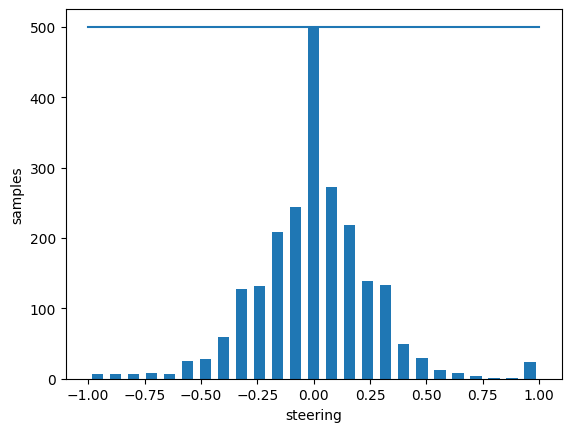

In [53]:
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
plt.xlabel('steering')
plt.ylabel('samples')

Это уже больше похоже на нормальное распределение

Создадим функцию для загрузки изображений и сопоставления их строкам в датасете по названию файла изображения

In [54]:
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir,left.strip()))
        steering.append(float(indexed_data[3])+0.15)
        # right image append
        image_path.append(os.path.join(datadir,right.strip()))
        steering.append(float(indexed_data[3])-0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

Разделим на тренировочную и валидационную выборки

Training Samples: 5392
Valid Samples: 1349


Text(0, 0.5, 'samples')

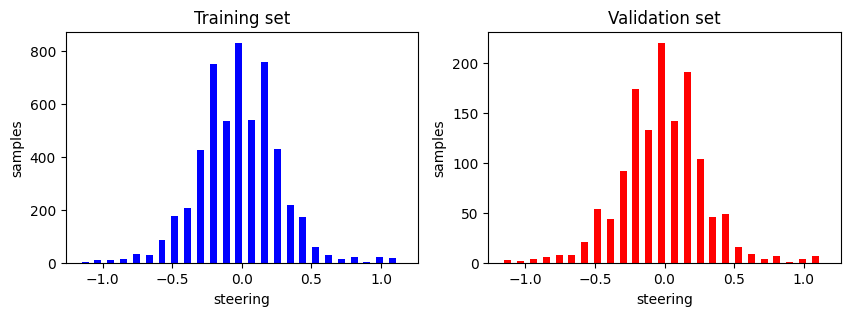

In [55]:
image_paths, steerings = load_img_steering('C://Users/User/Downloads/simulator-windows-64/data' + '/IMG', data)
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6,shuffle = 1)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

fig, axes = plt.subplots(1, 2, figsize=(10, 3))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[0].set_xlabel('steering')
axes[0].set_ylabel('samples')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')
axes[1].set_xlabel('steering')
axes[1].set_ylabel('samples')

Распредления близки между собой, поэтому можно дальше работать с этими данными

## Аугментация изображений

Далее чтобы модель не переобучилась на конкретном наборе данных и данных было достаточно необходимо провести аугментацию изображений. В данном случае я решил ипользовать 4 приёма аугментации:
1) Zoom. Рандомная картинка зумится на случайную величину в указанных пределах

2) Pan. Для случайной картинки задаётся отступ по оси X и по оси Y

3) Random Brightness. Для картинки задаётся случайная яркость в указанных пределах

4) Random Flip. Картинка поворачивается на случайную величину

Далее функция которая применяет случайную функцию аугментации к случайной картинке

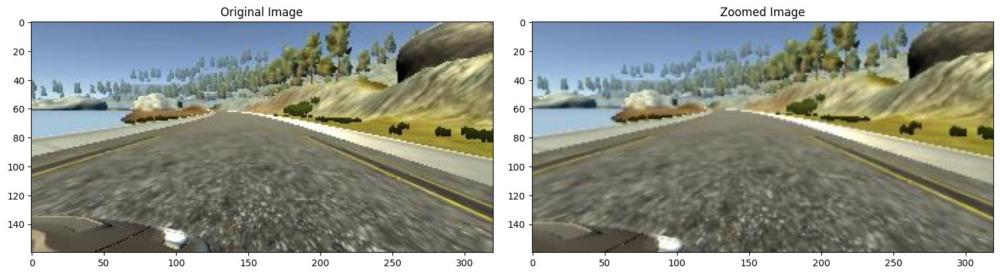

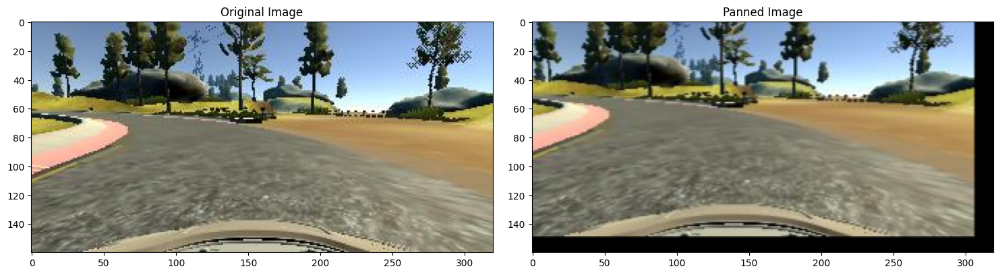

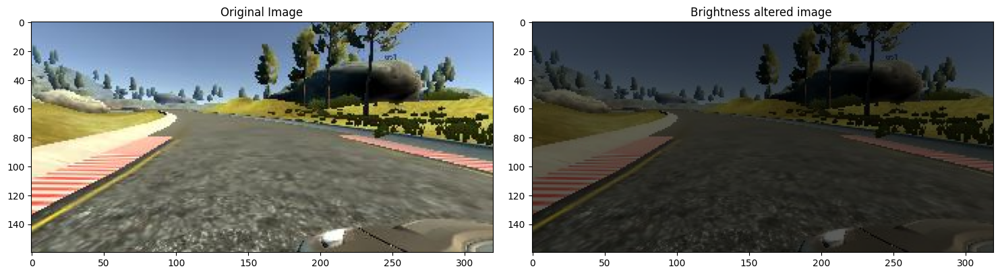

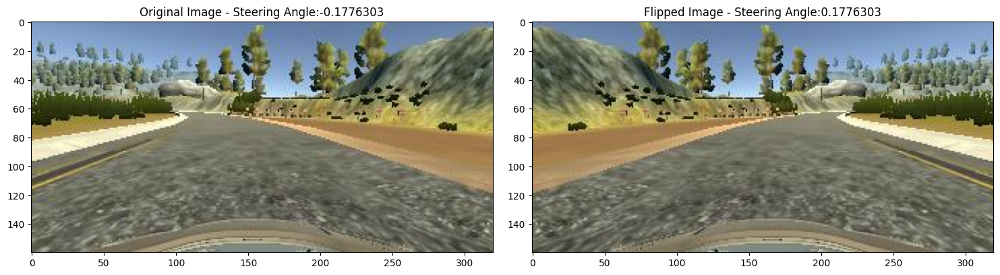

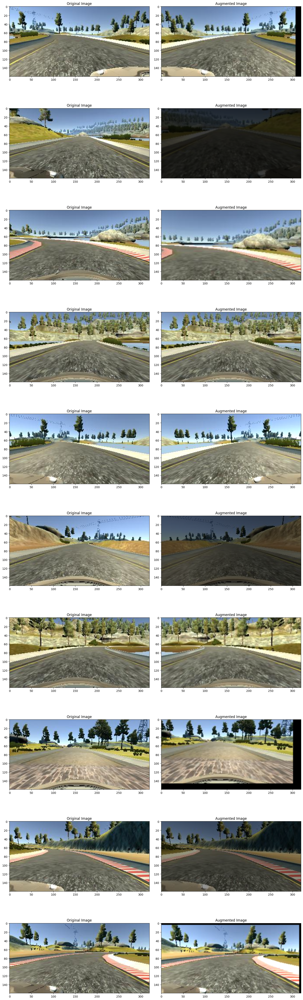

In [57]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')


def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]
    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)
    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

Далее так как наши изображения состоят не только из дорожного полотна, необходимо обрезать их выше 66 пикселей, а так же перевести в YUV цвета.

Text(0.5, 1.0, 'Preprocessed Image')

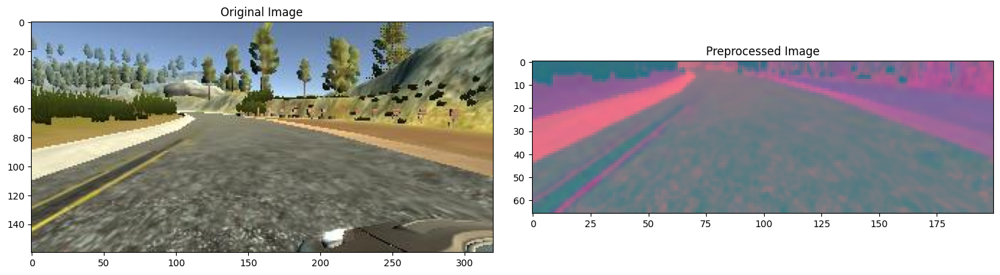

In [58]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

Теперь создадим генераторную функцию которая поработает со всеми изображениями датасета и вернёт уже полностью предобработанное изображение

Text(0.5, 1.0, 'Validation Image')

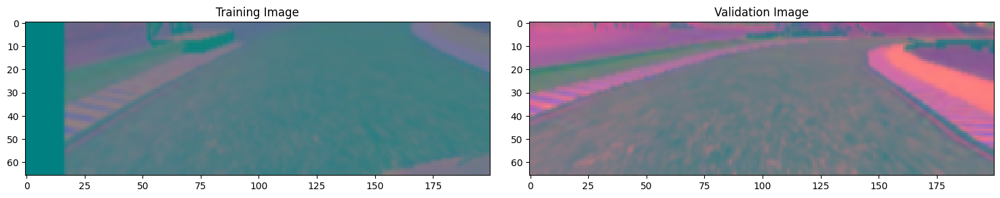

In [59]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
        random_index = random.randint(0, len(image_paths) - 1)
        if istraining:
            
            im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
        
        else:
            im = mpimg.imread(image_paths[random_index])
            steering = steering_ang[random_index]
            
        im = img_preprocess(im)
        batch_img.append(im)
        batch_steering.append(steering)
    
    yield (np.asarray(batch_img), np.asarray(batch_steering))  
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))


fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

Далее необходимо построить свёрточную нейронную сеть, для копирования поведения человека. Используем уже известную структуру разработанную компанией Nvidia и посмотрим на её качество.

## CNN

In [60]:
def nvidia_model():
    model = Sequential()
    model.add(Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Convolution2D(64, (3, 3), activation='elu'))
  
    model.add(Convolution2D(64, (3, 3), activation='elu'))
#   model.add(Dropout(0.5))
  
  
    model.add(Flatten())
  
    model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))
  
    model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))
  
    model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))
 
    model.add(Dense(1))
  
    optimizer = Adam(lr=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model
model = nvidia_model()
print(model.summary())
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300, 
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

Text(0.5, 0, 'Epoch')

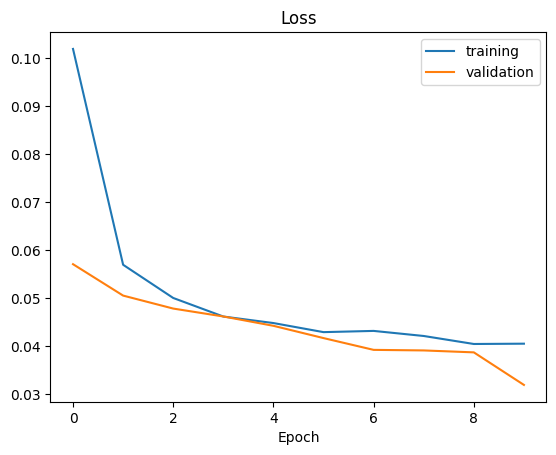

In [61]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')
#model.save('model.h5')

Качество нас устраивает, поэтому сохраняем и скачиваем модель.

In [62]:
model.save('model.h5')
model_loaded = keras.models.load_model('model.h5')